In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Toggle ON/OFF raw code cells."></form>''')

# CS82 tiles statistics

Here we analyse some photometric measurements of CS82' images.
The entire dataset is composed by 177 catalogs containing Sextractor's output for each tile of the CFHT survey over Stripe82.

For each tile/catalog we are going to:
* plot RA,Dec
 * _to have the footprint of detetions/masks applied_
* investigate magnitude limit
 * from the relation $$SNR = \frac{1.12}{mag_{err}}$$ and $$mag \approx \exp^{mag_{err}}$$ we'll estimate $mag_{lim}$
 
**Table of Contents**
1. [Understanding the data](#Understanding-the-data)
 * [Flags](#Flags)
 * [Footprint](#Footprint)
 * [Magnitude limit](#Magnitude-limit)
  * [Magnitude limit using histogram](#Magnitude-limit-using-histogram)

## Understanding the data

We start by using one tile to get some understanding about the data -- its structure and contents -- and to define the workflow to then apply to the other tiles.

The (test) tile to be used is ``'S82m0m_y.V2.7A.swarp.cut.deV.fit'``.

In [2]:
tilename = 'S82m0m_y.V2.7A.swarp.cut.deV.fit'

In [3]:
import astropy
import pandas
import bokeh
import numpy

from bokeh.io import output_notebook
output_notebook()

%matplotlib inline
import seaborn
seaborn.set()
from matplotlib import pyplot as plt

Loading BokehJS ...

The contents of the (tile) FITS file follows:

In [4]:
from astropy.io import fits
hdul = fits.open(tilename)
hdul.info()

Filename: S82m0m_y.V2.7A.swarp.cut.deV.fit
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU       4   ()              
1    LDAC_IMHEAD  BinTableHDU     12   1R x 1C      [12560A]   
2    LDAC_OBJECTS  BinTableHDU    530   113625R x 139C   [1J, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 15E, 15E, 15E, 15E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1J, 1D, 1D, 1D, 1D, 1E, 1E, 1D, 1D, 1D, 1D, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1J, 1I, 1I, 3J, 3J, 1E, 1E, 1E, 1E, 1E, 4E, 1E, 1D, 1D, 1D, 1D, 1E, 1E, 1E, 1E, 1I, 1E, 6E, 6E, 36E, 1E, 1B, 1I, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1D, 1D, 1D, 1D, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E]   


The Data Unit of our interest is the number ``2``.

In [5]:
#TODO: use booq
from astropy.table import Table
cat = Table.read(tilename,format='fits',hdu=2)
cat.colnames

['NUMBER',
 'FLUX_ISO',
 'FLUXERR_ISO',
 'MAG_ISO',
 'MAGERR_ISO',
 'FLUX_ISOCOR',
 'FLUXERR_ISOCOR',
 'MAG_ISOCOR',
 'MAGERR_ISOCOR',
 'FLUX_APER',
 'FLUXERR_APER',
 'MAG_APER',
 'MAGERR_APER',
 'FLUX_AUTO',
 'FLUXERR_AUTO',
 'MAG_AUTO',
 'MAGERR_AUTO',
 'FLUX_PETRO',
 'FLUXERR_PETRO',
 'MAG_PETRO',
 'MAGERR_PETRO',
 'FLUX_BEST',
 'FLUXERR_BEST',
 'MAG_BEST',
 'MAGERR_BEST',
 'SNR_WIN',
 'KRON_RADIUS',
 'PETRO_RADIUS',
 'BACKGROUND',
 'THRESHOLD',
 'FLUX_MAX',
 'ISOAREA_IMAGE',
 'XPEAK_WORLD',
 'YPEAK_WORLD',
 'ALPHAPEAK_J2000',
 'DELTAPEAK_J2000',
 'X_IMAGE',
 'Y_IMAGE',
 'X_WORLD',
 'Y_WORLD',
 'ALPHA_J2000',
 'DELTA_J2000',
 'A_WORLD',
 'B_WORLD',
 'THETA_WORLD',
 'THETA_J2000',
 'ERRA_WORLD',
 'ERRB_WORLD',
 'ERRTHETA_WORLD',
 'ERRTHETA_J2000',
 'MU_THRESHOLD',
 'MU_MAX',
 'ISOAREA_WORLD',
 'ISO0',
 'FLAGS',
 'FLAGS_WEIGHT',
 'IMAFLAGS_ISO',
 'NIMAFLAGS_ISO',
 'FWHM_WORLD',
 'ELONGATION',
 'ELLIPTICITY',
 'POLAR_WORLD',
 'CLASS_STAR',
 'FLUX_RADIUS',
 'FWHMPSF_WORLD',
 'XPSF_WORLD

### Flags

Flags in such catalogs inform about the quality of the measurements process.
Depending how we plan to use our data, flags are helpful to better select and understand our data.

In [6]:
flgs = pandas.Series(cat['FLAGS']).value_counts().to_frame(name='COUNTS').sort_index()
flgs.index.name = 'FLAGS'
print flgs
del flgs

       COUNTS
FLAGS        
0       98398
1        1360
2        6956
3        6775
4          74
5           1
6          12
7          19
16          1
18          6
19         23


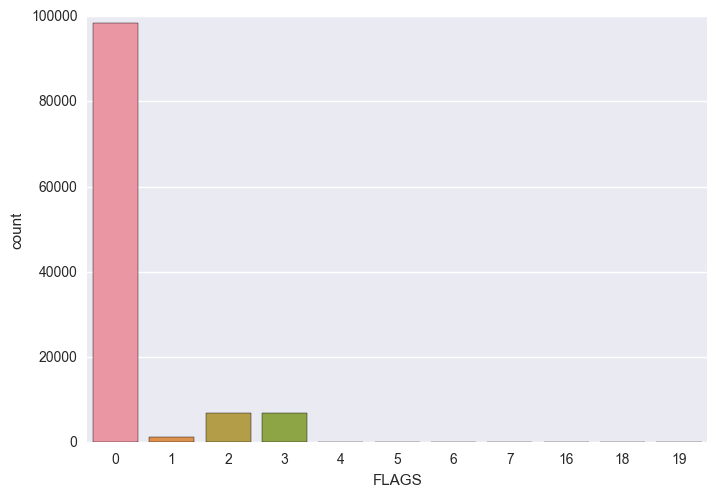

In [7]:
_ = seaborn.countplot(cat['FLAGS'])

In [8]:
flgs = pandas.Series(cat['FLAGS_WEIGHT']).value_counts().to_frame(name='COUNTS').sort_index()
flgs.index.name = 'FLAGS_WEIGHT'
print flgs
del flgs

              COUNTS
FLAGS_WEIGHT        
0             113162
2                463


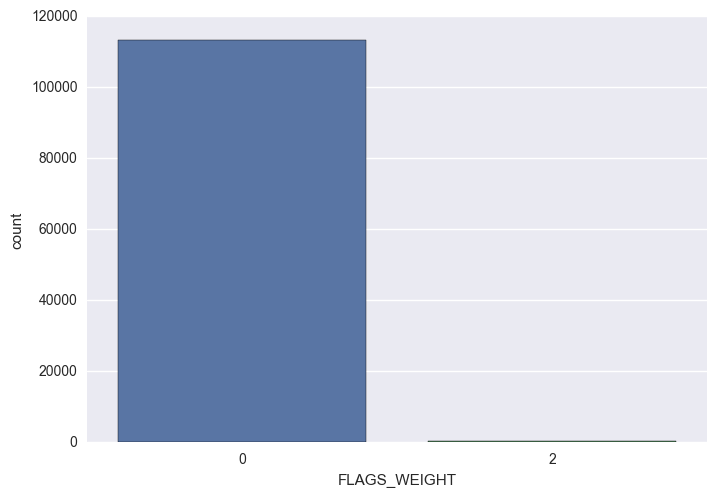

In [9]:
_ = seaborn.countplot(cat['FLAGS_WEIGHT'])

### Footprint

Plotting RA _vs_ Dec give us the view of the field.
For instance, geometrical-shaped holes in the plot indicate the presence of _masks_ during the segmentation process.

In [10]:
RA_col = 'ALPHA_J2000'
DEC_col = 'DELTA_J2000'

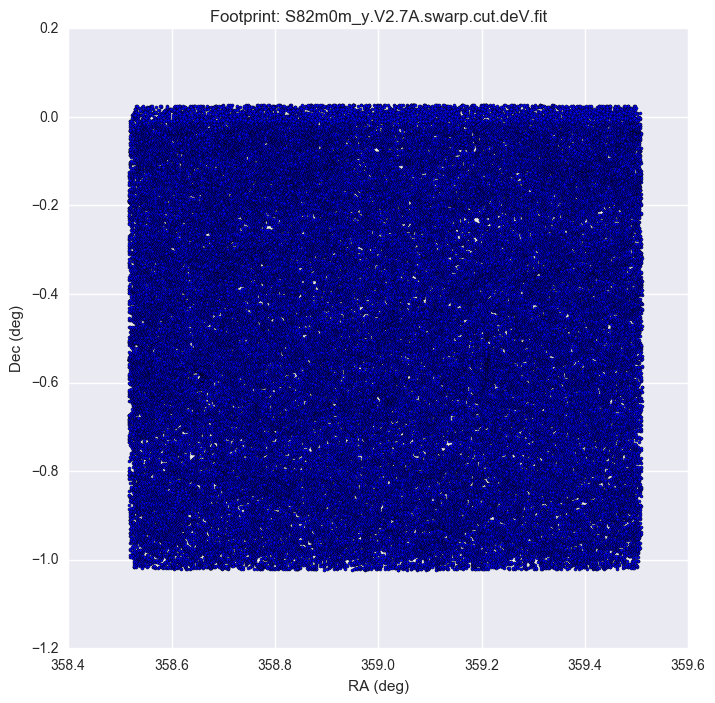

In [12]:
from matplotlib import pyplot as plt
fig, ax = plt.subplots()
fig.set_size_inches(8,8)
_ = ax.scatter(x=cat[RA_col], y=cat[DEC_col], marker='.')
_ = ax.set_xlabel('RA (deg)')
_ = ax.set_ylabel('Dec (deg)')
_title = 'Footprint: {}'.format(tilename)
_ = ax.set_title(_title)

In [13]:
# from bokeh.plotting import figure
# p = figure()
# p.circle(x=cat[RA_col], y=cat[DEC_col])
# p.xaxis.axis_label = 'RA'
# p.yaxis.axis_label = 'Dec'
# from bokeh.io import show
# show(p)

### Magnitude limit

Now we are going to investigate the limiting magnitude of the tile.
Magnitude and its error follow a pattern as we can see right below.

In [14]:
mag_col = 'MAG_AUTO'
err_col = 'MAGERR_AUTO'

In [15]:
cat2 = cat[mag_col,err_col]
mags = cat2.to_pandas()

nil_indxs = mags[mag_col]==99
mags.loc[nil_indxs,mag_col] = None

nil_indxs = mags[err_col]==99
mags.loc[nil_indxs,err_col] = None

In [16]:
def scatter_mags(mag_col,err_col,mags):
    from bokeh.plotting import figure
    p = figure()
    p.circle(x=mags[err_col], y=mags[mag_col])
    p.xaxis.axis_label = 'Mag_err'
    p.yaxis.axis_label = 'Mag'
    _title = '{}: measurement vs error'.format(mag_col)
    p.title.text = _title
    return p

from bokeh.io import show
show(scatter_mags(mag_col,err_col,mags))

Looks like we have a logarithmic relation following this data:
$$ y = \alpha + \beta * log(\gamma + x) $$

In other words, as the photometric measurement goes to fainter objects the error goes exponencially high.

We can explore this relation to better define our sample based on such measurement errors.

In [17]:
mags_sort_byErr = mags.sort_values(by=err_col)
mags_sort_byErr.dropna(inplace=True)

In [18]:
def func(t, a, b):
    import numpy as np
    return a + b * np.log(t)

def scatter_mags_fit(mag_col,err_col,mags_sort_byErr):
    p = scatter_mags(mag_col,err_col,mags_sort_byErr)

    def fit_log_curve(x,y):
        import numpy as np

        from scipy.optimize import curve_fit
        popt,pcov = curve_fit(func, x, y)

        x = np.linspace(x.min(),x.max(),100)
        y = func(x,*popt)
        return x,y,popt

    x,y,popt = fit_log_curve(mags_sort_byErr[err_col], mags_sort_byErr[mag_col])

    p.line(x=x, y=y, line_color='red', legend='{:.3f} + {:.3f} * log(x)'.format(*popt), line_width=2)
    p.legend.location = 'bottom_right'

    return p

show(scatter_mags_fit(mag_col,err_col,mags_sort_byErr))

If we take the relation between signal-to-noise ratio (SNR) and Mag_err is given by [???]:
$$ SNR = \frac{1.12}{Mag_{err}} $$

We can now define a cut on the limiting magnitude based on this definition of signal-to-noise ratio.

For example, for this tile, if I want a SNR of 5, corresponding to $Mag_{err} = 0.224$, I should go no further than $Mag \approx 24.6$.

In [20]:
from scipy.optimize import curve_fit
popt,pcov = curve_fit(func, mags_sort_byErr[err_col], mags_sort_byErr[mag_col])


MagErr_SNR = 0.224
Mag_SNR = func(MagErr_SNR,*popt)
print 'Magnitude limit: {:.3f}, corresponding to an error of {}'.format(Mag_SNR,MagErr_SNR)

Magnitude limit: 24.595, corresponding to an error of 0.224


In [21]:
def scatter_mags_fit_annot(mag_col,err_col,mags_sort_byErr, MagErr_SNR):
    p = scatter_mags_fit(mag_col,err_col,mags_sort_byErr)

    Mag_SNR = func(MagErr_SNR,*popt)
    
    from bokeh.models import Span
    line_mag_snr = Span(dimension='width', location=Mag_SNR, line_color='red', line_dash='dashed', line_width=1)
    line_magerr_snr = Span(dimension='height', location=MagErr_SNR, line_color='red', line_dash='dashed', line_width=1)

    p.add_layout(line_mag_snr)
    p.add_layout(line_magerr_snr)

    from bokeh.models import Label
    _lbl = ' {:.3f}, {:.2f} '.format(MagErr_SNR,Mag_SNR)
    label_mag_snr = Label(x=MagErr_SNR+0.01, y=Mag_SNR-1, text=_lbl, text_color='red',
                          border_line_color='black', border_line_alpha=1.0,
                          background_fill_color='white', background_fill_alpha=1.0)
    p.add_layout(label_mag_snr)
    
    return p

show(scatter_mags_fit_annot(mag_col,err_col,mags_sort_byErr, MagErr_SNR))

### Magnitude limit using histogram

The goal now is to define the limiting magnitude in a different way, we will consider the variation of magnitude-error across the same-valued magnitude entries. The approach computes mean and standard-deviation of the magnitude-error in a set of magnitude-binned measurements.

In [22]:
# nbins = int(round(np.power(len(mags_sort_byErr),1/3.)))
nbins = 20
bin_categories,bins = pandas.qcut(mags_sort_byErr[mag_col], nbins, retbins=True, precision=2)

mags_sort_byErr['bins'] = bin_categories
del nbins,bin_categories

In [23]:
mags_sort_byErr.groupby('bins').describe()

MAGERR_AUTO     MAG_AUTO
bins                                           
[12.43, 20.32]  count  5682.000000  5682.000000
                mean      0.004786    18.955988
                std       0.004234     1.201894
                min       0.000095    12.432558
                25%       0.001839    18.298164
                50%       0.003568    19.257684
                75%       0.006601    19.907383
                max       0.063452    20.323442
(20.32, 21.37]  count  5681.000000  5681.000000
                mean      0.017044    20.902431
                std       0.008668     0.294338
                min       0.002815    20.323635
                25%       0.011158    20.663359
                50%       0.015581    20.929260
                75%       0.020870    21.161318
                max       0.076999    21.365822
(21.37, 21.96]  count  5681.000000  5681.000000
                mean      0.032130    21.684938
                std       0.011875     0.172381
                min       0.004113    21.365910
                25%       0.024011    21.538027
                50%       0.029785    21.696442
                75%       0.037791    21.836166
                max       0.144562    21.962530
(21.96, 22.37]  count  5681.000000  5681.000000
                mean      0.046650    22.180508
                std       0.014756     0.118655
                min       0.006064    21.962557
                25%       0.036060    22.079563
                50%       0.043595    22.185917
...                            ...          ...
(24.49, 24.64]  std       0.029855     0.043938
                min       0.079360    24.490572
                25%       0.177284    24.528309
                50%       0.195702    24.565786
                75%       0.210767    24.604883
                max       0.402423    24.643457
(24.64, 24.81]  count  5681.000000  5681.000000
                mean      0.206858    24.727037
                std       0.030980     0.049008
                min       0.087335    24.643475
                25%       0.190671    24.685001
                50%       0.209969    24.726400
                75%       0.225947    24.769209
                max       0.401235    24.813929
(24.81, 25.033] count  5681.000000  5681.000000
                mean      0.222836    24.916811
                std       0.034420     0.062877
                min       0.106610    24.813932
                25%       0.205023    24.862511
                50%       0.226834    24.913954
                75%       0.244064    24.969687
                max       0.576044    25.033489
(25.033, 25.98] count  5681.000000  5681.000000
                mean      0.245677    25.228655
                std       0.043234     0.151370
                min       0.113691    25.033516
                25%       0.216962    25.108091
                50%       0.249230    25.195126
                75%       0.273313    25.316526
                max       0.473922    25.976839

[160 rows x 2 columns]

In [24]:
%matplotlib inline

import seaborn as sns
sns.set()
from matplotlib import pyplot as plt

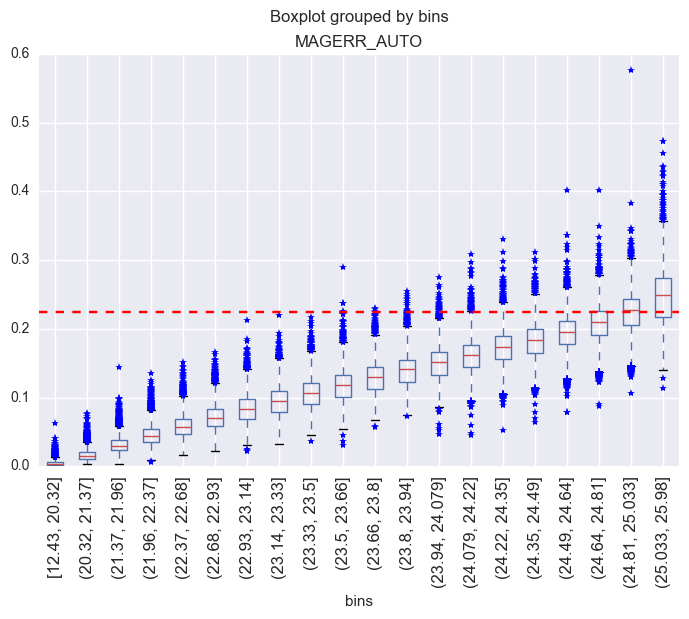

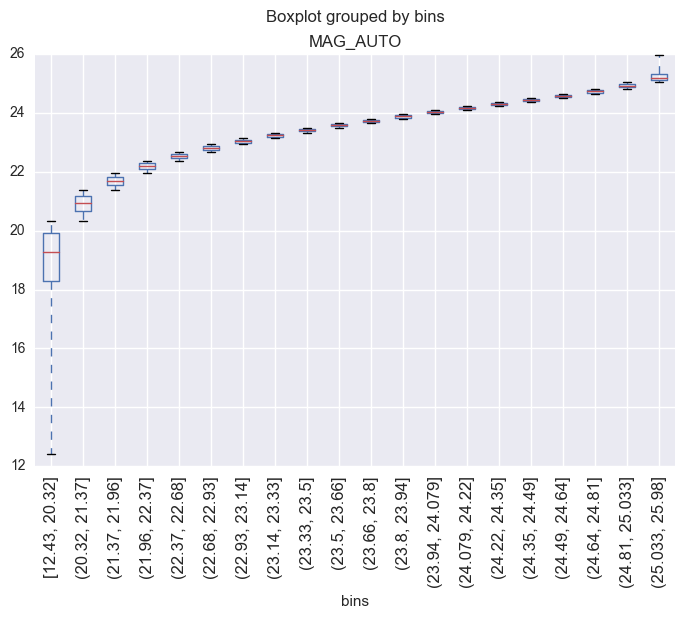

In [25]:
ax1 = mags_sort_byErr.boxplot(by='bins', column='MAGERR_AUTO', rot=90, sym='*')
ax1.axhline(MagErr_SNR, color='red', ls='--')
ax2 = mags_sort_byErr.boxplot(by='bins', column='MAG_AUTO', rot=90, whis='range')

In [26]:
groups = []
for n,g in mags_sort_byErr.groupby('bins'):
    print n,g.describe()
    q = g['MAGERR_AUTO']
    dq = q.quantile(0.75)-q.quantile(0.25)
    mq = q.quantile(0.5)
    if mq-1.5*dq < MagErr_SNR and mq+1.5*dq > MagErr_SNR:
        groups.append(g)
print len(groups)

[12.43, 20.32]           MAG_AUTO  MAGERR_AUTO
count  5682.000000  5682.000000
mean     18.955988     0.004786
std       1.201894     0.004234
min      12.432558     0.000095
25%      18.298164     0.001839
50%      19.257684     0.003568
75%      19.907383     0.006601
max      20.323442     0.063452
(20.32, 21.37]           MAG_AUTO  MAGERR_AUTO
count  5681.000000  5681.000000
mean     20.902431     0.017044
std       0.294338     0.008668
min      20.323635     0.002815
25%      20.663359     0.011158
50%      20.929260     0.015581
75%      21.161318     0.020870
max      21.365822     0.076999
(21.37, 21.96]           MAG_AUTO  MAGERR_AUTO
count  5681.000000  5681.000000
mean     21.684938     0.032130
std       0.172381     0.011875
min      21.365910     0.004113
25%      21.538027     0.024011
50%      21.696442     0.029785
75%      21.836166     0.037791
max      21.962530     0.144562
(21.96, 22.37]           MAG_AUTO  MAGERR_AUTO
count  5681.000000  5681.000000
mean     22.

In [27]:
print sum(g.MAG_AUTO.mean() for g in groups)/len(groups)

24.7718769073
